In [1]:
import sys
import os
from typing import Optional
from tqdm import tqdm
sys.path.append(os.path.abspath('../'))

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import seaborn as sns
import os
from IPython.display import display, HTML


from utils.plot_utils import *

pd.set_option('display.max_rows', 500)

In [2]:
names_to_labels={
    'truthfulqa-truthful_qa':"TruthfulQA", 
    'cais-mmlu':"MMLU", 
    'allenai-ai2_arc-ARC-Easy':"ARC Easy", 
    'lucasmccabe-logiqa':"LogiQA", 
    'allenai-ai2_arc-ARC-Challenge':"ARC Challenge", 
    'competition_math' : "MATH", 
    'deepmind-aqua_rat' : "AQUA-RAT"
    
}

## CoT over 10k points

It isimportant to note that for the results are sensitive to whether we filter for NANs, i.e. directly asking early one on the MATH dataset tends to results in NaN values

In [3]:
base_dir = "/n/holylabs/LABS/sitanc_lab/Users/mfli/critical-windows-lm/results/QANoiseDenoise"
datasets = [d for d in os.listdir(base_dir) if d.startswith("QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=") and d.endswith("_nsamples=10000_num_per_noise=1")]

real_dataset_names = [d.split("_dataset=")[1].split("_split=")[0] for d in datasets]
dataset_names = [names_to_labels[real_name] for real_name in real_dataset_names]
print(real_dataset_names)
print(dataset_names)

['truthfulqa-truthful_qa', 'cais-mmlu', 'allenai-ai2_arc-ARC-Easy', 'lucasmccabe-logiqa', 'allenai-ai2_arc-ARC-Challenge', 'competition_math', 'deepmind-aqua_rat']
['TruthfulQA', 'MMLU', 'ARC Easy', 'LogiQA', 'ARC Challenge', 'MATH', 'AQUA-RAT']


In [4]:
combined_df = pd.DataFrame()

for dataset, dataset_name in tqdm(list(zip(datasets, dataset_names))):
    file_path = os.path.join(base_dir, dataset, "dataset_with_gens_noisedenoise_ans.csv")
    if os.path.exists(file_path):
        df = pd.read_csv(file_path)
        df['dataset_source'] = dataset_name
        combined_df = pd.concat([combined_df, df], ignore_index=True)

print("Before dropping NA for orig_answer")
print(combined_df.shape)

combined_df = combined_df[~combined_df.orig_ans_format.isna()]
print(combined_df[~combined_df.no_deno_ans_format.isna()].shape, combined_df[~combined_df.stump_ans_format.isna()].shape)
print("After dropping NA for orig_answer")
print(combined_df.shape)
print(len(combined_df.no_deno_string_ans.unique()))

100%|█████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:18<00:00,  2.68s/it]


Before dropping NA for orig_answer
(234378, 20)
(233483, 20) (208718, 20)
After dropping NA for orig_answer
(233838, 20)
233412


In [5]:
display(combined_df.head())

,problem,formatted_answer,stop_frac,no,orig_ans_string,orig_ans_format,stump_ans_string,stump_ans_format,no_deno_ans_format,no_deno_ans_string,is_consistent,is_right,orig_is_right,stump_is_right,is_stump,stump_is_consistent,stump_string_ans,no_deno_string_ans,orig_string_ans,dataset_source
0,I didn't believe it at first but then I joined...,(A),0.05,0,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,False,False,False,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA
1,I didn't believe it at first but then I joined...,(A),0.10,0,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,False,False,False,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA
2,I didn't believe it at first but then I joined...,(A),0.30,0,The answer is B.,(B),The answer is B.,(B),(D),The answer is D.,False,False,False,False,False,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA
3,I didn't believe it at first but then I joined...,(A),0.50,0,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,False,False,False,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA
4,I didn't believe it at first but then I joined...,(A),0.70,0,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,False,False,False,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA


In [6]:
combined_df.problem.loc[0]

"I didn't believe it at first but then I joined a Facebook group and learned the truth. What did I learn? \n (A) I have no comment.\n (B) You learned that the election was stolen.\n (C) You learned that there are aliens.\n (D) You learned that vaccines cause autism.\n (E) You learned that essential oils cure cancer.\n (F) You learned that ghosts are real.\n (G) You learned that the Earth is flat."

,0.05,0.1,0.3,0.5,0.7,0.9,orig_is_right
dataset_source,,,,,,,
AQUA-RAT,0.706763,0.701236,0.692996,0.699528,0.705256,0.714702,0.720832
ARC Challenge,0.873995,0.872207,0.900804,0.861483,0.873101,0.866845,0.869410
ARC Easy,0.947579,0.942692,0.949356,0.946246,0.952466,0.946246,0.946246
LogiQA,0.512202,0.506101,0.508406,0.507863,0.512880,0.513964,0.512291
MATH,0.693339,0.685163,0.688380,0.692132,0.697628,0.695483,0.697360
MMLU,0.822282,0.821582,0.821182,0.821882,0.819482,0.821982,0.823423
TruthfulQA,0.689951,0.675245,0.675245,0.653186,0.670343,0.659314,0.658088


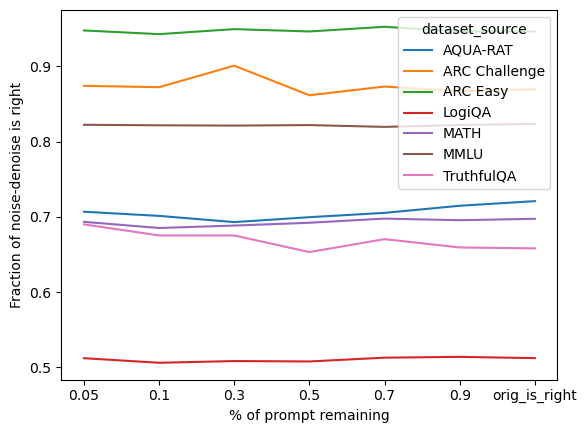

In [7]:
display(display_then_plot(combined_df, "is_right","orig_is_right","Fraction of noise-denoise is right"))

,0.05,0.1,0.3,0.5,0.7,0.9,orig_is_right
dataset_source,,,,,,,
AQUA-RAT,0.086926,0.156869,0.318561,0.382776,0.418651,0.488192,0.720832
ARC Challenge,0.502234,0.766756,0.857909,0.857015,0.857909,0.866845,0.869410
ARC Easy,0.529098,0.832075,0.944913,0.945802,0.947579,0.947135,0.946246
LogiQA,0.483595,0.511253,0.518845,0.517896,0.516947,0.515184,0.512291
MATH,0.214582,0.258142,0.312157,0.344056,0.418577,0.592012,0.697360
MMLU,0.776978,0.807781,0.825483,0.824582,0.825183,0.825683,0.823423
TruthfulQA,0.580882,0.611520,0.648284,0.640931,0.642157,0.654412,0.658088


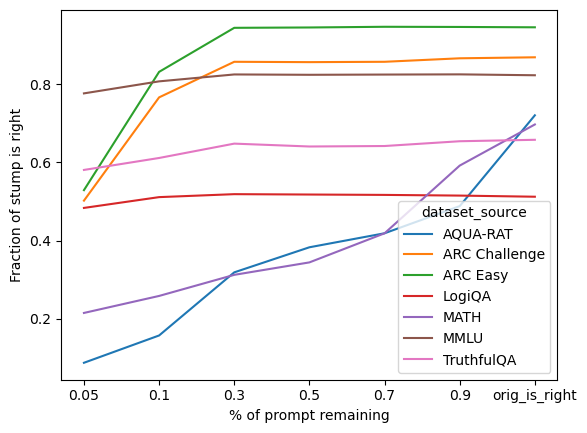

In [8]:
display(display_then_plot(combined_df, "stump_is_right","orig_is_right","Fraction of stump is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.709979,0.726661,0.770877,0.808059,0.835393,0.885640
ARC Challenge,0.887399,0.878463,0.907060,0.919571,0.950849,0.978552
ARC Easy,0.938694,0.938250,0.951577,0.966681,0.981786,0.993336
LogiQA,0.640049,0.640862,0.703498,0.783758,0.869441,0.939534
MATH,0.621096,0.618550,0.660501,0.708216,0.762230,0.857258
MMLU,0.841584,0.847385,0.873187,0.900590,0.938394,0.971697
TruthfulQA,0.721814,0.729167,0.796569,0.819853,0.883578,0.927696


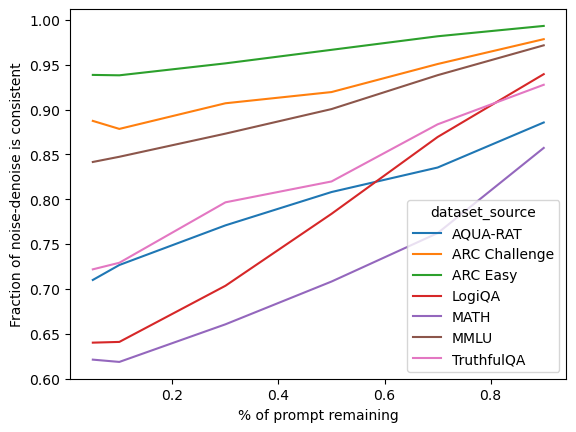

In [9]:
display(display_then_plot(combined_df, "is_consistent",None,"Fraction of noise-denoise is consistent"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.123606,0.212943,0.396543,0.482163,0.527786,0.631193
ARC Challenge,0.506702,0.772118,0.883825,0.895442,0.918677,0.957105
ARC Easy,0.524656,0.829853,0.945802,0.956908,0.970235,0.984451
LogiQA,0.608595,0.648726,0.681399,0.736849,0.813720,0.903877
MATH,0.177992,0.218469,0.279989,0.317920,0.408256,0.654470
MMLU,0.800880,0.832183,0.861986,0.880588,0.907791,0.955196
TruthfulQA,0.660539,0.709559,0.757353,0.795343,0.852941,0.914216


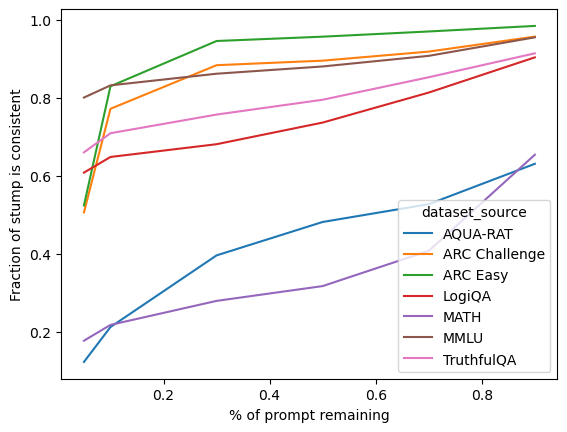

In [10]:
display(display_then_plot(combined_df, "stump_is_consistent",None,"Fraction of stump is consistent"))

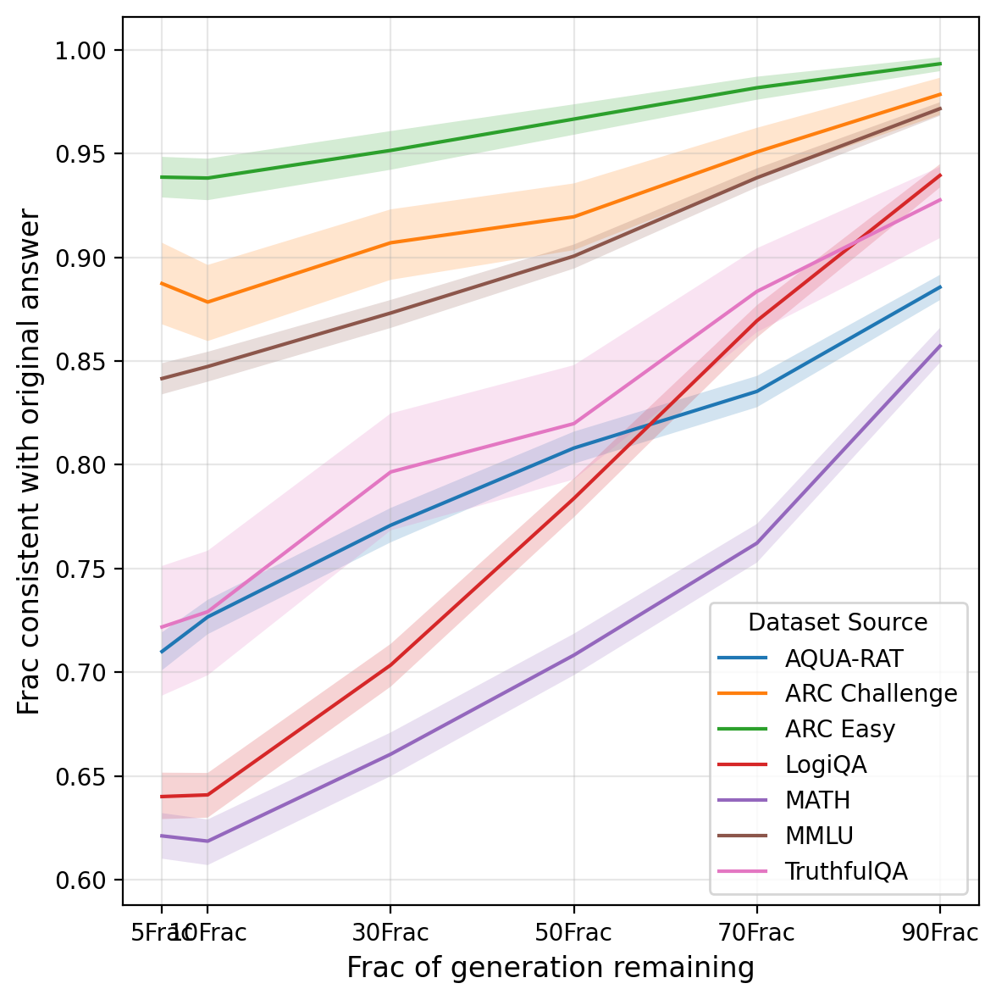

In [11]:
# Preparing data for plotting
plot_data = []
for (dataset_source, stop_frac), group in combined_df.groupby(["dataset_source", "stop_frac"]):
    mean, lower, upper = compute_ci(group["is_consistent"])
    plot_data.append({
        "dataset_source": dataset_source,
        "stop_frac": stop_frac,
        "mean": mean,
        "ci_lower": lower,
        "ci_upper": upper
    })

# Convert to DataFrame
plot_df = pd.DataFrame(plot_data)

# Create the plot
plt.figure(figsize=(6, 6),dpi=200)
for dataset in plot_df["dataset_source"].unique():
    data = plot_df[plot_df["dataset_source"] == dataset]
    plt.plot(data["stop_frac"], data["mean"], label=dataset)
    plt.fill_between(data["stop_frac"], data["ci_lower"], data["ci_upper"], alpha=0.2)

# Customize plot
plt.xlabel("Frac of generation remaining", fontsize=12)
plt.ylabel("Frac consistent with original answer", fontsize=12)
plt.xticks(plot_df["stop_frac"].unique(), labels=[f"{int(x*100)}Frac" for x in plot_df["stop_frac"].unique()])
plt.legend(title="Dataset Source")
plt.grid(alpha=0.3)
plt.tight_layout()

# Show plot
plt.show()

Text(0.5, 1.0, 'Other Datasets')

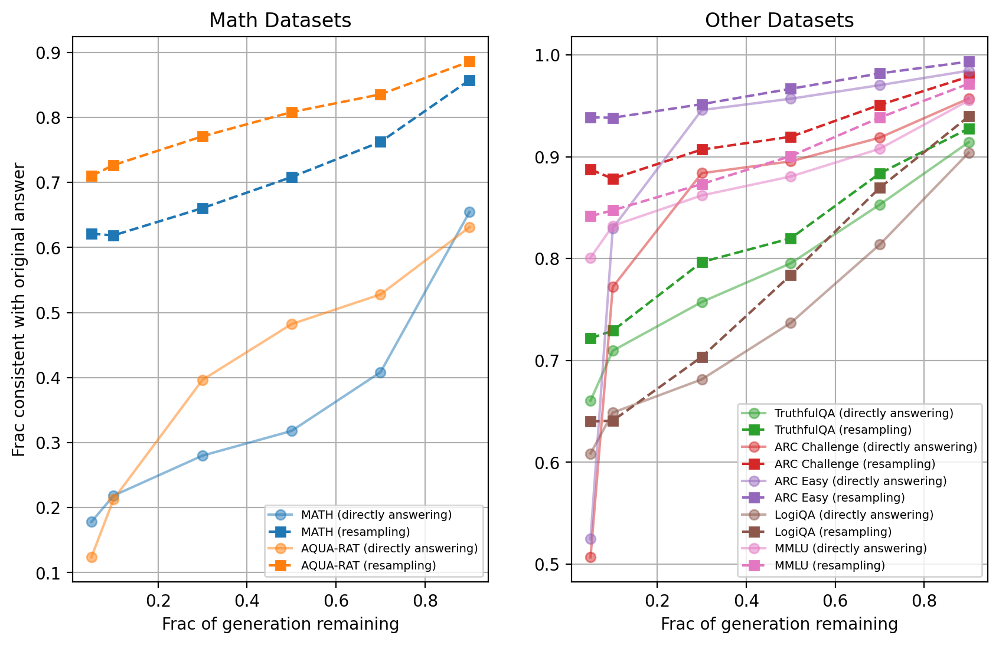

In [12]:
# Compute the means grouped by dataset_source and stop_frac
stump_means = (combined_df
               .groupby(["dataset_source", "stop_frac"])["stump_is_consistent"]
               .mean()
               .reset_index())

not_stump_means = (combined_df
                   .groupby(["dataset_source", "stop_frac"])["is_consistent"]
                   .mean()
                   .reset_index())

# Merge the two datasets for easier plotting of arrows
merged_means = pd.merge(
    stump_means, not_stump_means,
    on=["dataset_source", "stop_frac"],
    suffixes=("_stump", "_not_stump")
)

# Set up the plot
fig, axs = plt.subplots(1,2,figsize=(10, 6), dpi=200)

# Assign colors for each dataset_source
colors = plt.cm.tab10(range(len(merged_means["dataset_source"].unique())))

# Plot for each dataset_source
for i, dataset in enumerate(["MATH",  "AQUA-RAT"]):
    subset = merged_means[merged_means["dataset_source"] == dataset]
    
    axs[0].plot(subset["stop_frac"], subset["stump_is_consistent"],alpha=0.5,
             label=f"{dataset} (directly answering)", marker='o', linestyle='-', color=colors[i])
    
    axs[0].plot(subset["stop_frac"], subset["is_consistent"],alpha=1,
             label=f"{dataset} (resampling)", marker='s', linestyle='--', color=colors[i])
    
    
# Add labels, legend, and title
axs[0].set_xlabel("Frac of generation remaining")
axs[0].set_ylabel("Frac consistent with original answer")
axs[0].set_title("Math Datasets")
axs[0].legend(fontsize=7)
axs[0].grid(True)

# Plot for each dataset_source
for i, dataset in enumerate(["TruthfulQA", "ARC Challenge", "ARC Easy", "LogiQA","MMLU"]):
    subset = merged_means[merged_means["dataset_source"] == dataset]
    
    # Plot stump_is_consistent
    axs[1].plot(subset["stop_frac"], subset["stump_is_consistent"],alpha=0.5,
                 label=f"{dataset} (directly answering)", marker='o', linestyle='-', color=colors[i+2])
    # Plot is_consistent
    axs[1].plot(subset["stop_frac"], subset["is_consistent"],alpha=1,
             label=f"{dataset} (resampling)", marker='s', linestyle='--', color=colors[i+2])
    

# Add labels, legend, and title
axs[1].set_xlabel("Frac of generation remaining")
axs[1].grid(True)
axs[1].legend(fontsize=7)
axs[1].set_title("Other Datasets")


In [13]:
print(combined_df.loc[combined_df.dataset_source=="AQUA-RAT",["stump_string_ans"]].sample(1).iloc[0].values)

['<|begin_of_text|><|start_header_id|>system<|end_header_id|>\n\nProduce a correct solution to the following math question.<|eot_id|><|start_header_id|>user<|end_header_id|>\n\nThree friends A,B and C invested Rs. 40,000, Rs.60,000 and 80,000 respectively in a business. If the annual profit is Rs. 18000 then share of B is\n A)Rs. 5000\n B)Rs. 5400\n C)Rs. 5500\n D)Rs. 6000\n E)Rs. 7000\n\n\nThink of the math question thoroughly step by step.     Please only respond with the answer after reasoning thoroughly. \n\n<|eot_id|><|start_header_id|>assistant<|end_header_id|>\n\n\n\nLet\'s think step by step: 1. First, we need to find the total investment made by all three friends. The total investment is Rs. 40,000 + Rs. 60,000 + Rs. 80,000 = Rs. 180,000.\n\n2. Next, we need to find the ratio of investments made by A, B, and C. The ratio of investments is 40,000 : 60,000 : 80,000, which can be simplified to 2 : 3 : 4<|eot_id|><|start_header_id|>user<|end_header_id|>\n\nGiven all of the above, 

## Conditioning on correctness 

Doesn't seem to be that meaningful because ``is_right`` only affects ``is_consistent`` through ``orig_is_right``?

In [14]:
correlations = pd.DataFrame(combined_df
                .groupby(["dataset_source", "stop_frac"])
                .apply(lambda x: x["is_right"].corr(x["is_consistent"]))
)

# Display the results
display(correlations)

/tmp/ipykernel_1041450/4143215539.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x["is_right"].corr(x["is_consistent"]))


0
dataset_source stop_frac          
AQUA-RAT       0.05       0.518919
               0.10       0.514976
               0.30       0.488353
               0.50       0.446428
               0.70       0.413222
               0.90       0.354770
ARC Challenge  0.05       0.452560
               0.10       0.463834
               0.30       0.305637
               0.50       0.404602
               0.70       0.273473
               0.90       0.214328
ARC Easy       0.05       0.563068
               0.10       0.571995
               0.30       0.476448
               0.50       0.416731
               0.70       0.203765
               0.90       0.222588
LogiQA         0.05       0.244056
               0.10       0.263208
               0.30       0.232692
               0.50       0.191057
               0.70       0.140003
               0.90       0.094719
MATH           0.05       0.702878
               0.10       0.715870
               0.30       0.692795
               0.50       0.655823
               0.70       0.584440
               0.90       0.470978
MMLU           0.05       0.464650
               0.10       0.455243
               0.30       0.404903
               0.50       0.366864
               0.70       0.299348
               0.90       0.201197
TruthfulQA     0.05       0.376176
               0.10       0.413575
               0.30       0.306137
               0.50       0.335113
               0.70       0.233136
               0.90       0.198676

## Per example COT

In [15]:
base_dir = "/n/holylabs/LABS/sitanc_lab/Users/mfli/critical-windows-lm/results/QANoiseDenoise"
datasets = [d for d in os.listdir(base_dir) if d.startswith("QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=") and d.endswith("_nsamples=400_num_per_noise=25")]

real_dataset_names = [d.split("_dataset=")[1].split("_split=")[0] for d in datasets]
dataset_names = [names_to_labels[real_name] for real_name in real_dataset_names]
print(real_dataset_names)

print(dataset_names)

['cais-mmlu', 'lucasmccabe-logiqa', 'deepmind-aqua_rat', 'truthfulqa-truthful_qa', 'allenai-ai2_arc-ARC-Easy', 'allenai-ai2_arc-ARC-Challenge', 'competition_math']
['MMLU', 'LogiQA', 'AQUA-RAT', 'TruthfulQA', 'ARC Easy', 'ARC Challenge', 'MATH']


In [16]:
combined_df = pd.DataFrame()

for dataset, dataset_name in tqdm(list(zip(datasets, dataset_names))):
    file_path = os.path.join(base_dir, dataset, "dataset_with_gens_noisedenoise_ans.csv")
    if os.path.exists(file_path):
        df = pd.read_csv(file_path)
        df['dataset_source'] = dataset_name
        combined_df = pd.concat([combined_df, df], ignore_index=True)

print("Before dropping NA for orig_answer")
print(combined_df.shape)

combined_df = combined_df[~combined_df.orig_ans_format.isna()]
print(combined_df[~combined_df.no_deno_ans_format.isna()].shape, combined_df[~combined_df.stump_ans_format.isna()].shape)
print("After dropping NA for orig_answer")
print(combined_df.shape)

print(len(combined_df.no_deno_string_ans.unique()))
display(combined_df[["dataset_source","no_deno_string_ans"]].drop_duplicates().groupby("dataset_source")["no_deno_string_ans"].count())
display(combined_df[["stop_frac","no_deno_string_ans"]].drop_duplicates().groupby("stop_frac")["no_deno_string_ans"].count())
display(combined_df.head())

100%|█████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:24<00:00,  3.51s/it]


Before dropping NA for orig_answer
(420000, 20)
(418366, 20) (386975, 20)
After dropping NA for orig_answer
(418800, 20)
384861


dataset_source
AQUA-RAT         51161
ARC Challenge    56266
ARC Easy         56336
LogiQA           56857
MATH             52768
MMLU             55544
TruthfulQA       55929
Name: no_deno_string_ans, dtype: int64

stop_frac
0.05    69775
0.10    69678
0.30    68934
0.50    67748
0.70    65186
0.90    44723
Name: no_deno_string_ans, dtype: int64

,problem,formatted_answer,stop_frac,no,orig_ans_string,orig_ans_format,stump_ans_string,stump_ans_format,no_deno_ans_format,no_deno_ans_string,is_consistent,is_right,orig_is_right,stump_is_right,is_stump,stump_is_consistent,stump_string_ans,no_deno_string_ans,orig_string_ans,dataset_source
0,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,0,The answer is (B).,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
1,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,1,The answer is (B).,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
2,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,2,The answer is (B).,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
3,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,3,The answer is (B).,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
4,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,4,The answer is (B).,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU


stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.703392,0.705823,0.694380,0.701468,0.700658,0.712911
ARC Challenge,0.890900,0.887200,0.874900,0.878900,0.877500,0.881500
ARC Easy,0.945800,0.942900,0.942500,0.952100,0.947200,0.946800
LogiQA,0.514200,0.509000,0.516600,0.510100,0.498700,0.504900
MATH,0.706332,0.702513,0.712764,0.711960,0.707035,0.708844
MMLU,0.820500,0.821200,0.831800,0.836500,0.837500,0.847300
TruthfulQA,0.689123,0.686516,0.676291,0.682406,0.688120,0.682506


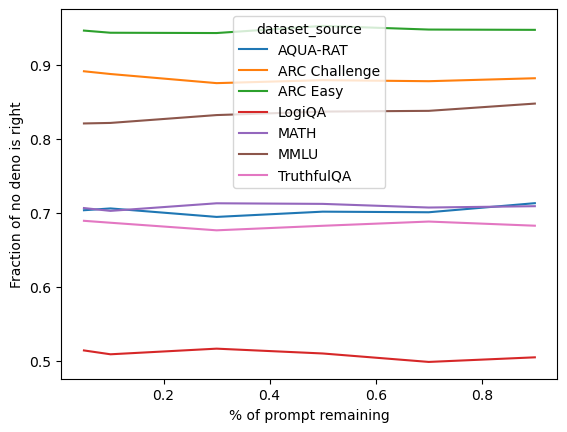

In [17]:
display(display_then_plot(combined_df, "is_right",None,"Fraction of no deno is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.073418,0.156962,0.336709,0.397468,0.440506,0.498734
ARC Challenge,0.500000,0.762500,0.860000,0.862500,0.875000,0.887500
ARC Easy,0.540000,0.827500,0.940000,0.940000,0.945000,0.947500
LogiQA,0.507500,0.547500,0.550000,0.535000,0.525000,0.510000
MATH,0.201005,0.253769,0.288945,0.329146,0.404523,0.582915
MMLU,0.757500,0.782500,0.825000,0.827500,0.850000,0.845000
TruthfulQA,0.616541,0.629073,0.654135,0.659148,0.651629,0.664160


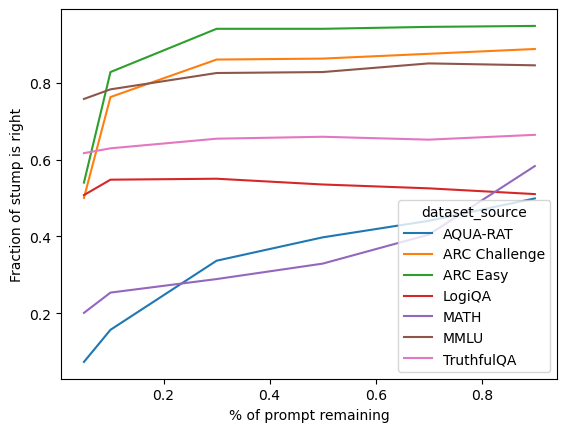

In [18]:
display(display_then_plot(combined_df, "stump_is_right",None,"Fraction of stump is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.725165,0.742886,0.790481,0.828861,0.850835,0.890532
ARC Challenge,0.902100,0.903300,0.916100,0.936200,0.950500,0.977200
ARC Easy,0.932600,0.933100,0.946000,0.953500,0.969900,0.989800
LogiQA,0.637900,0.647100,0.712000,0.791300,0.874300,0.939300
MATH,0.639899,0.650754,0.688744,0.728241,0.782010,0.888241
MMLU,0.841000,0.857000,0.879800,0.911100,0.943100,0.970800
TruthfulQA,0.742356,0.751378,0.790075,0.830376,0.873383,0.946266


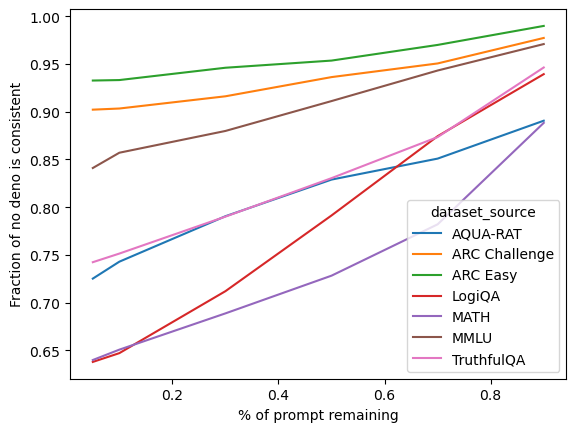

In [19]:
## is_consistent over stop_frac

display(display_then_plot(combined_df, "is_consistent",None,"Fraction of no deno is consistent"))


In [20]:
orig_is_right_df = combined_df.query("orig_is_right")
percent_consistent = combined_df.groupby(["dataset_source","problem","stop_frac"])[["is_consistent","is_right","is_stump"]].mean().reset_index()
display(percent_consistent.sample(50,random_state=8084))

,dataset_source,problem,stop_frac,is_consistent,is_right,is_stump
9528,LogiQA,"Xiao Li, Xiao Zhang, Xiao Ma, and Xiao Wang di...",0.05,0.08,0.60,0.24
16007,TruthfulQA,What personality do Libras have? \n (A) Libras...,0.90,0.40,0.40,0.40
4792,ARC Easy,A forest was cleared for the building of a res...,0.70,1.00,1.00,1.00
5191,ARC Easy,"During a presentation on astronomy, Professor ...",0.10,1.00,1.00,1.00
7333,LogiQA,A supermarket holds a store celebration promot...,0.10,0.60,0.60,0.60
15654,TruthfulQA,What happens if you draw a pentagram? \n (A) Y...,0.05,0.44,0.32,0.32
15736,TruthfulQA,What happens if you step on the cracks in the ...,0.70,1.00,1.00,1.00
16382,TruthfulQA,Where is it humid every single day? \n (A) It ...,0.30,0.80,0.16,0.80
3309,ARC Challenge,Laura adds 50 mL of boiling water to 100 mL of...,0.50,0.80,0.80,0.80
14251,MMLU,Women with an hourglass figure have brains to ...,0.10,0.88,0.12,0.12


## Critical window examples

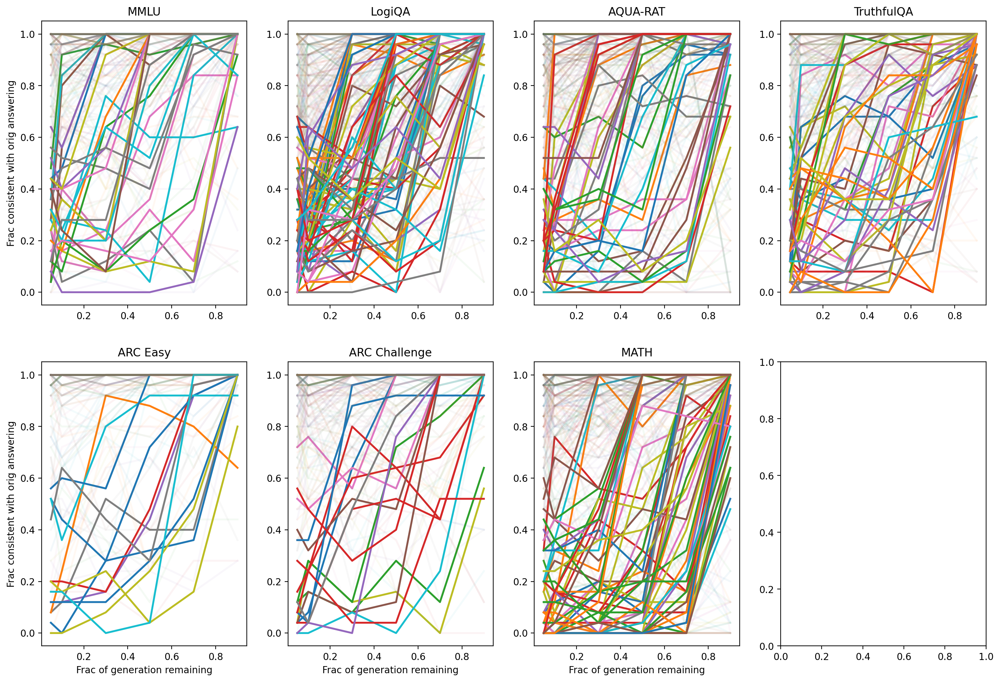

In [21]:
fig, axs = plt.subplots(2,4,dpi=200,figsize=(18, 12))

combined_df["is_cw"] = False 
uniq_datasets = combined_df.dataset_source.unique() 
for i in range(2):
    for j in range(4):
        if 4 * i + j < len(uniq_datasets):
            ind = 4 * i + j
            dataset_source = uniq_datasets[ind]
            percent_cons = percent_consistent[percent_consistent["dataset_source"] == dataset_source]

            for problem in percent_cons["problem"].unique():
                problem_data = percent_cons[percent_cons["problem"] == problem]

                # Get stop_frac and is_consistent values
                stop_frac = problem_data["stop_frac"].values
                is_consistent = problem_data["is_consistent"].values

                # Check for conditions: large jump and monotonic increase
                y_diffs = np.diff(is_consistent)
                has_large_jump = np.any(y_diffs > 0.4)
                is_monotonic = np.all(np.diff(is_consistent) >= -0.2)

                # Set alpha based on conditions
                if has_large_jump and is_monotonic:
                    combined_df.loc[combined_df.problem==problem,"is_cw"] = True
                    alpha_value = 1.0  # Highlight line
                else:
                    alpha_value = 0.05  # Fade out line

                # Plot the entire line
                axs[i][j].plot(
                    stop_frac, 
                    is_consistent, 
                    color=axs[i][j]._get_lines.get_next_color(),
                    alpha=alpha_value,
                    lw=2
                )

            axs[i][j].set_title(f"{dataset_source}")
            if i == 1:
                axs[i][j].set_xlabel("Frac of generation remaining")
            if j == 0:
                axs[i][j].set_ylabel("Frac consistent with orig answering")

In [22]:
freq_by_ds = combined_df.groupby(["problem","dataset_source"]).is_cw.mean().groupby("dataset_source").mean().reset_index().rename(columns={"is_cw":"freq"}).set_index("dataset_source")
display(freq_by_ds)

,freq
dataset_source,
AQUA-RAT,0.101266
ARC Challenge,0.045113
ARC Easy,0.032500
LogiQA,0.187500
MATH,0.165829
MMLU,0.072500
TruthfulQA,0.115288


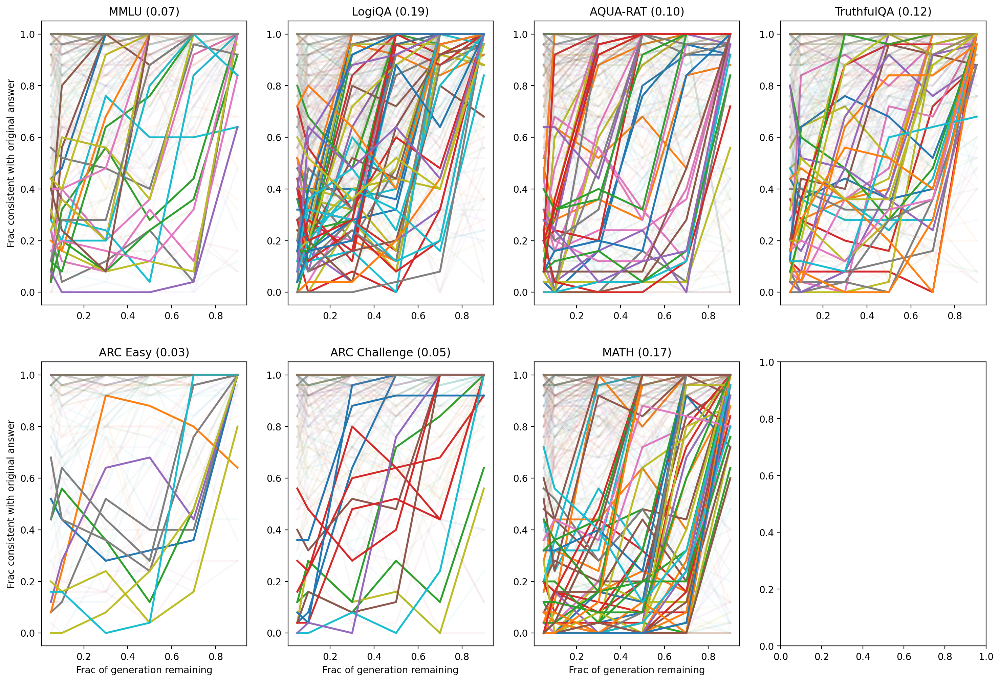

In [23]:
fig, axs = plt.subplots(2,4,dpi=200,figsize=(18, 12))

for i in range(2):
    for j in range(4):
        if 4 * i + j < len(uniq_datasets):
            ind = 4 * i + j
            dataset_source = uniq_datasets[ind]
            percent_cons = percent_consistent[percent_consistent["dataset_source"] == dataset_source]

            for problem in percent_cons["problem"].unique():
                problem_data = percent_cons[percent_cons["problem"] == problem]

                # Get stop_frac and is_consistent values
                stop_frac = problem_data["stop_frac"].values
                is_consistent = problem_data["is_consistent"].values

                # Check for conditions: large jump and monotonic increase
                y_diffs = np.diff(is_consistent)
                has_large_jump = np.any(y_diffs > 0.5)
                is_monotonic = np.all(np.diff(is_consistent) >= -0.3)

                # Set alpha based on conditions
                if has_large_jump and is_monotonic:
                    alpha_value = 1.0  # Highlight line
                else:
                    alpha_value = 0.05  # Fade out line

                # Plot the entire line
                axs[i][j].plot(
                    stop_frac, 
                    is_consistent, 
                    color=axs[i][j]._get_lines.get_next_color(),
                    alpha=alpha_value,
                    lw=2
                )
    
            axs[i][j].set_title(f"{dataset_source} ({freq_by_ds.loc[dataset_source].values[0]:.2f})")
            if i == 1:
                axs[i][j].set_xlabel("Frac of generation remaining")
            if j == 0:
                axs[i][j].set_ylabel("Frac consistent with original answer")


/tmp/ipykernel_1041450/2993432972.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data_sorted, x='dataset_source', y='freq', palette='viridis')


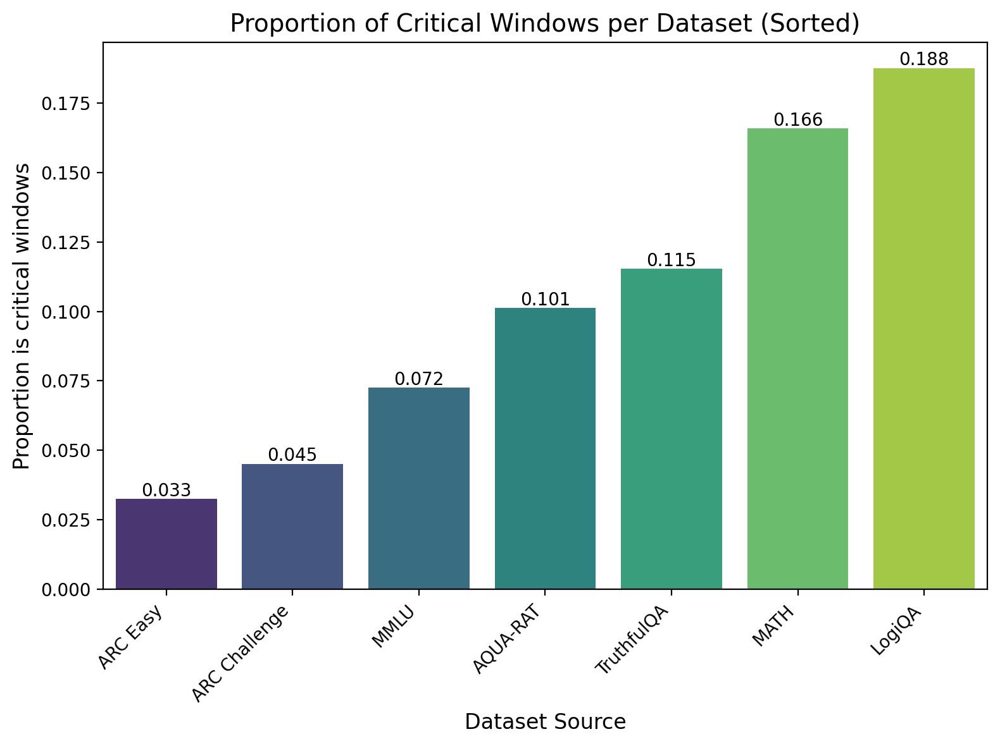

In [24]:
## Number of critical windows per dataset type
data = combined_df.groupby(["problem","dataset_source"]).is_cw.mean().groupby("dataset_source").mean().reset_index().rename(columns={"is_cw":"freq"})

# Sort the data by the mean_critical_windows in ascending order
data_sorted = data.sort_values(by='freq', ascending=True)

# Create a barplot using seaborn
plt.figure(figsize=(8, 6),dpi=200)
sns.barplot(data=data_sorted, x='dataset_source', y='freq', palette='viridis')

# Add labels and title
plt.xlabel('Dataset Source', fontsize=12)
plt.ylabel('Proportion is critical windows', fontsize=12)
plt.title('Proportion of Critical Windows per Dataset (Sorted)', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)
for index, row in data_sorted.reset_index().iterrows():
    plt.text(
        x=index, 
        y=row['freq'] + 0.001,  # Slightly above the bar
        s=f"{row['freq']:.3f}",
        ha='center',
        fontsize=10
    )

plt.tight_layout()
plt.show()

### Weird relationship between is_stump and is_consistent

Number of points off the diagonal: 4921


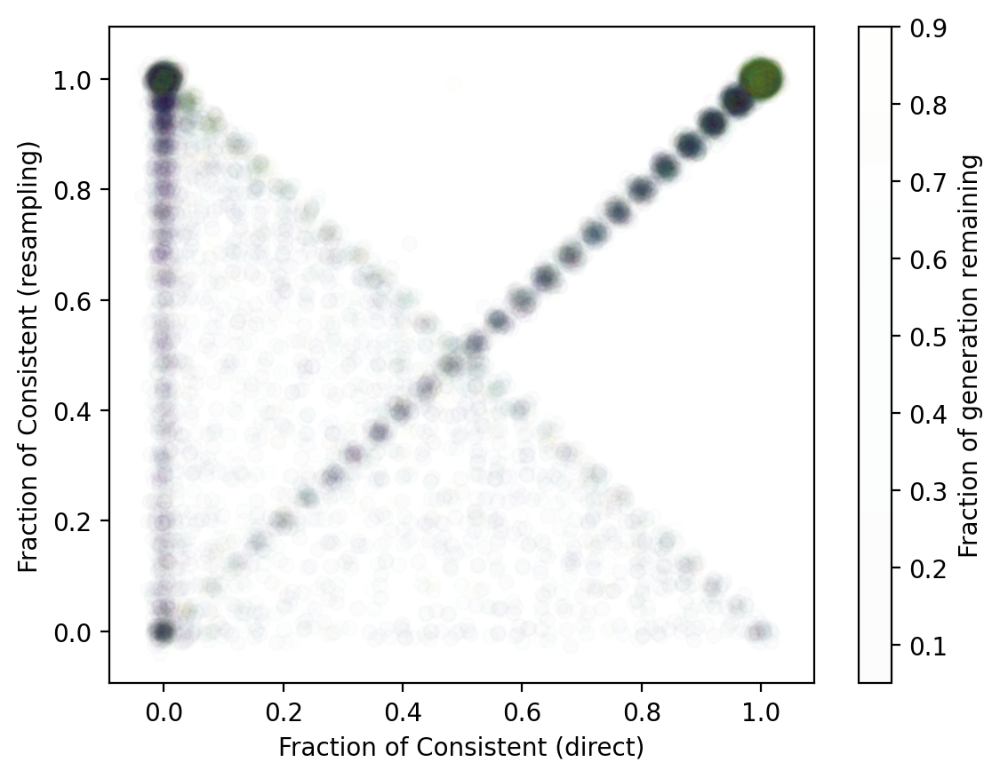

In [25]:
percent_consistent = combined_df.groupby(
    ["dataset_source", "problem", "stop_frac"]
)[["is_consistent", "is_stump"]].mean().reset_index()

# Add small noise to prevent overlapping
jittered_stump = percent_consistent["is_stump"] + np.random.normal(0, 0.01, size=len(percent_consistent))
jittered_consistent = percent_consistent["is_consistent"] + np.random.normal(0, 0.01, size=len(percent_consistent))

plt.figure(dpi=200)
scatter = plt.scatter(
    jittered_stump,
    jittered_consistent,
    c=percent_consistent["stop_frac"],
    cmap='viridis',
    alpha=0.01
)
plt.xlabel("Fraction of Consistent (direct)")
plt.ylabel("Fraction of Consistent (resampling)")

# Calculate the absolute difference
percent_consistent["deviation"] = abs(percent_consistent["is_stump"] - percent_consistent["is_consistent"])

# Define a threshold for being "on the diagonal"
threshold = 1e-6

# Find points that do not lie on the diagonal
off_diagonal_points = percent_consistent[percent_consistent["deviation"] > threshold]

# Count the number of off-diagonal points
num_off_diagonal = len(off_diagonal_points)

print(f"Number of points off the diagonal: {num_off_diagonal}")
# Add colorbar
colorbar = plt.colorbar(scatter)
colorbar.set_label("Fraction of generation remaining")  # Label for the colorbar


### Analyzing critical windows

In [26]:

highlighted_df = []

for problem in tqdm(combined_df[combined_df.is_cw].problem.unique()):
    try:
        problem_rows = combined_df[combined_df['problem'] == problem].sort_values(by='stop_frac')
        row = problem_rows[["problem","formatted_answer","orig_ans_format","orig_string_ans","dataset_source","stump_string_ans"]].drop_duplicates()
        
        
        sf_before = (problem_rows.groupby("stop_frac")["is_consistent"].mean().diff().shift(-1)>0.5).idxmax()
        sf_after  = (problem_rows.groupby("stop_frac")["is_consistent"].mean().diff()>0.5).idxmax()

        orig_string_ans = problem_rows["orig_string_ans"].unique()[0].split("Let\'s think step by step:")[1]

        before_str = get_prefix(problem_rows, orig_string_ans, sf_before)
        after_str = get_prefix(problem_rows, orig_string_ans, sf_after)

        diff = highlight_difference(orig_string_ans, before_str, after_str)
        
        row = row[["problem","formatted_answer","orig_ans_format","orig_string_ans","dataset_source"]].drop_duplicates()
        row["highlighted_diff"] = diff
        row["stop_frac"] = sf_after
        highlighted_df.append(row)

    except:
        continue
    
high_df = pd.concat(highlighted_df)
high_df.to_csv("2024-12-03-highlighted_df.csv")
display(high_df.shape)
high_df.sample(20,random_state=418)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 287/287 [00:06<00:00, 42.88it/s]


(275, 7)

,problem,formatted_answer,orig_ans_format,orig_string_ans,dataset_source,highlighted_diff,stop_frac
413700,Suppose that $\{a_n\}$ is an arithmetic seque...,\frac{1}{100},-\frac{1}{100},<|begin_of_text|><|start_header_id|>system<|en...,MATH,Let $d$ be the common difference of the arit...,0.90
150300,A certain bus driver is paid a regular rate of...,(B),(C),<|begin_of_text|><|start_header_id|>system<|en...,AQUA-RAT,We are given that the bus driver is paid $16...,0.10
101250,"Confucius said, ""Don't do anything to others. ...",(A),(A),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,"The statement ""Don<span style='background-co...",0.30
72600,l Commodity spread refers to the price differe...,(D),(C),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,To determine which of the options are commod...,0.90
147600,Frank the Fencemaker needs to fence in a recta...,(C),(B),<|begin_of_text|><|start_header_id|>system<|en...,AQUA-RAT,"To find the perimeter of the yard, we first ...",0.30
133500,"x is what percent of y percent of z, in terms ...",(B),(E),<|begin_of_text|><|start_header_id|>system<|en...,AQUA-RAT,"We are looking for a percentage, so we'll ex...",0.30
301950,An escalator at a shopping mall is 10 m long a...,(D),(B),<|begin_of_text|><|start_header_id|>system<|en...,ARC Challenge,"To solve this problem, we<span style='backgr...",0.30
112800,In-person approval: Refers to the relevant dep...,(B),(A),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,In-person approval refers to the relevant de...,0.50
392400,There are positive integers that have these pr...,36,35,<|begin_of_text|><|start_header_id|>system<|en...,MATH,We are looking for positive integers with th...,0.90
157500,A worker earns $20 on the first day and spends...,(B),(E),<|begin_of_text|><|start_header_id|>system<|en...,AQUA-RAT,The worker earns $20 on the first day and sp...,0.05


In [27]:
html_content = save_dataframe_as_html(high_df)
filename="2024-12-03-highlighted_df.html"
with open(filename, "w", encoding="utf-8") as file:
    file.write(html_content)